## Notebook initialization

These cells configure the environment and do other initialization aspects.

In [0]:
import os
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline

import cv2
import torch
from tqdm import tqdm_notebook
from PIL import Image
import glob
import torch.nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from sklearn.model_selection import train_test_split
from torchvision import transforms

In [0]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
skip_training = True  # Set this flag to True before validation and submission
if skip_training:
    # The models are always evaluated on CPU
    device = torch.device("cpu")

## Data
Run the cell below to get data from local storage to this notebook. This block separation of data into logical variables and previews the contents.

### Connecting to GDrive and setting the paths

In [3]:
# Connect to Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [4]:
# Change to data directory to match the environment
PATH = F"/content/gdrive/My Drive/Colab Notebooks/deeplearn2019/project/data"
os.chdir(PATH)  #change directory to the data folder
print("Changed directory to ", os.getcwd())

Changed directory to  /content/gdrive/My Drive/Colab Notebooks/deeplearn2019/project/data


In [42]:
# Tunable parameters
TRAIN_BS = 50 # Batch-size of training
SUMB_BS = 25 # Batch-size of submission/test
IMG_SIZE = 64 # Resolution of the image when given as input to the net
N_EPOCHS = 10
SPLIT_TRAIN_FRACTION = 0.15 # how big fraction of train data is used for validation
TRAIN_SUBFOLDERS = 79 # How many subfolders including and starting from 001 
TEST_SUBFOLDERS = 1
FOLDERSIZE = 1000
SUB_FOLDERSIZE = 56103
WORKERS = 8

# Directory paths
TRAIN_CSV_DIR = os.path.join(PATH, 'train.csv')
TRAIN_SAMPLE_CSV_DIR = os.path.join(PATH, 'train_sample.csv')
TEST_CSV_DIR = os.path.join(PATH, 'test.csv')
TEST_SAMPLE_CSV_DIR = os.path.join(PATH, 'test_sample.csv')
SAMPLE_SUBMISSION = os.path.join(PATH, 'sample_submission.csv')
SUBMISSION_PATH = os.path.join(PATH,'submission.csv')

TRAIN_IMGS_DIR = os.path.join(PATH, 'train')
TEST_IMGS_DIR = os.path.join(PATH, 'test')

TRAIN_IMGS_RESIZED = os.path.join(PATH, 'train_resized')
TEST_IMGS_RESIZED = os.path.join(PATH, 'test_resized_full')

#TRAIN_IMGS_PROCESSED = os.path.join(PATH, 'train_processed')
#TEST_IMGS_PROCESSED = os.path.join(PATH, 'test_processed')

#NUMPY_DIR = os.path.join(PATH, 'numpy')
MODEL_DIR = os.path.join(PATH, 'models')
MODEL_NAME = 'densenet-121-79k'
MODEL_PATH = os.path.join(MODEL_DIR, MODEL_NAME)

# Other Aliases
ID_COLNAME = 'file_name'
FOLDER_COLNAME = 'folder'
ANSWER_COLNAME = 'category_id'

print("Variables and aliases have been set.")

Variables and aliases have been set.


In [6]:
## Loads the dataframe of the training data
train_df_all = pd.read_csv(TRAIN_CSV_DIR)
train_df_all.head()

,category_id,date_captured,file_name,frame_num,id,location,rights_holder,seq_id,seq_num_frames,width,height
0,19,2011-05-13 23:43:18,5998cfa4-23d2-11e8-a6a3-ec086b02610b.jpg,1,5998cfa4-23d2-11e8-a6a3-ec086b02610b,33,Justin Brown,6f084ccc-5567-11e8-bc84-dca9047ef277,3,1024,747
1,19,2012-03-17 03:48:44,588a679f-23d2-11e8-a6a3-ec086b02610b.jpg,2,588a679f-23d2-11e8-a6a3-ec086b02610b,115,Justin Brown,6f12067d-5567-11e8-b3c0-dca9047ef277,3,1024,747
2,0,2014-05-11 11:56:46,59279ce3-23d2-11e8-a6a3-ec086b02610b.jpg,1,59279ce3-23d2-11e8-a6a3-ec086b02610b,96,Erin Boydston,6faa92d1-5567-11e8-b1ae-dca9047ef277,1,1024,747
3,0,2013-10-06 02:00:00,5a2af4ab-23d2-11e8-a6a3-ec086b02610b.jpg,1,5a2af4ab-23d2-11e8-a6a3-ec086b02610b,57,Erin Boydston,6f7d4702-5567-11e8-9e03-dca9047ef277,1,1024,747
4,0,2011-07-12 13:11:16,599fbd89-23d2-11e8-a6a3-ec086b02610b.jpg,3,599fbd89-23d2-11e8-a6a3-ec086b02610b,46,Justin Brown,6f1728a1-5567-11e8-9be7-dca9047ef277,3,1024,747


### Helper functions

In [0]:
### Helper functions
## Just simple count of files in folder
def check_number_of_files(folder):
    try:
        filecount = len([name for name in os.listdir(folder) if os.path.isfile(os.path.join(folder, name))])
    except OSError as err:
        filecount = check_number_of_files(folder)
    return filecount

## Gets fullfilepaths of each file in the given folder
def get_filepaths(folder):
    try:
        filepaths = [os.path.join(folder,'{}').format(name) for name in os.listdir(folder) if os.path.isfile(os.path.join(folder, name))]
    except OSError as err:
        filepaths = get_filepaths(folder)
    return filepaths

## Forms list of list that contains fullfilepaths of each of the image found inside given subfolders
def get_filepaths_of_subfolders(main_folder, num_subfolders, start_folder = 1):
    img_filepaths = []
    filecount = 0
    end_folder = start_folder + num_subfolders - 1
    for num in range(start_folder, end_folder + 1):
        print("Progress: %d (%d/%d)"%(num, num-start_folder+1, end_folder-start_folder+1))
        num_str = "{:03d}".format(num)
        subfolder_path = os.path.join(main_folder, num_str)
        #print("Current folder number: ", num_str)

        # Getting filepaths of subfolder
        folder_filepaths = get_filepaths(subfolder_path)
        filecount+= len(folder_filepaths)
        img_filepaths.append(folder_filepaths)
        #print("Example filepath: ", img_filepaths[num-1][0])
    #print("Total files: ", filecount)
    return img_filepaths
  
def extract_img_names(filepaths):
  names = []
  if (type(filepaths[0]) == type(['',''])): # For lists of lists
      for _, paths in enumerate(filepaths):
          for _, img_path in enumerate(paths):
              names.append(os.path.splitext(os.path.basename(img_path))[0])
  elif (type(filepaths[0]) == type('')): # For lists
      for _, img_path in enumerate(filepaths):
          names.append(os.path.splitext(os.path.basename(img_path))[0])
  return names

def extract_img_filenames(filepaths):
  names = []
  if (type(filepaths[0]) == type(['',''])): # For lists of lists
      for _, paths in enumerate(filepaths):
          for _, img_path in enumerate(paths):
              names.append(os.path.basename(img_path))
  elif (type(filepaths[0]) == type('')): # For lists
      for _, img_path in enumerate(filepaths):
          names.append(os.path.basename(img_path))
  return names

## This creates new dataframe that includes only the rows with matching file_name values
def form_df_from_filenames(df, filenames):
    indeces = []
    tmp_df = df
    tmp_df[FOLDER_COLNAME] = 0
    N = len(filenames)
    for count, filename in enumerate(filenames):
        df_row = tmp_df[tmp_df[ID_COLNAME] == filename]
        indeces.append(df_row.index[0])
        if ((count+1) % 1000 == 0):
            print("Progress %d/%d"%(count + 1, N))
    #print(len(indeces))
    new_df = tmp_df.iloc[indeces,:]
    #print(new_df.iloc[0])    
    return new_df
  
def add_folder_numbers(df, subfolders, folder_column, foldersize = 1000, start_folder = 1):
    # Adding folder column so the files don't require search later
    idx = 0
    end_folder = start_folder + subfolders - 1
    for i in range(start_folder, end_folder + 1):
      df.iloc[idx:idx + foldersize,folder_column:folder_column+1] = i
      idx+=foldersize
    #print(df.iloc[0])
    return df           

# Move files into subdirectories.
# N = the number of files in seach subfolder folder
def move_files_to_subdirectories(path, N=1000):
    files = [os.path.join(path, f) for f in os.listdir(path)]
    i = 0
    curr_subdir = None
    for f in files:
        # create new subdir if necessary
        if i % N == 0:
            subdir_name = os.path.join(path, '{0:03d}'.format(int(i / N + 1)))
            os.mkdir(subdir_name)
            curr_subdir = subdir_name

        # move file to current dir
        f_base = os.path.basename(f)
        shutil.move(f, os.path.join(subdir_name, f_base))
        i += 1  

### Form new dataframes to match the image subsets used

In [12]:
if skip_training == False:
    print("Forming filepath collection of all image files inside given subfolders.")
    TRAIN_FILEPATHS = get_filepaths_of_subfolders(TRAIN_IMGS_RESIZED, TRAIN_SUBFOLDERS)

if os.path.isfile(TRAIN_SAMPLE_CSV_DIR):
    print("Loading the sample dataframe from a file.")
    train_sample_df = pd.read_csv(TRAIN_SAMPLE_CSV_DIR)
else:
    print("No file was found. Constructing dataframe from filepaths.")
    train_img_filenames = extract_img_filenames(TRAIN_FILEPATHS)
    print("Forming a new dataframe as subset of the files found inside the subfolders.")
    train_sample_df = form_df_from_filenames(train_df_all, train_img_filenames)
    print("Adding easy way to directly locate the image files without search later after shuffling the data.")
    train_sample_df = add_folder_numbers(train_sample_df, TRAIN_SUBFOLDERS, 11, FOLDERSIZE)
    print("Saving the modified dataframe to file for later use.")
    train_sample_df.to_csv(TRAIN_SAMPLE_CSV_DIR)

#print(len(train_sample_df))
print(train_sample_df.iloc[0])


Loading the sample dataframe from a file.
Unnamed: 0                                           82001
category_id                                              0
date_captured                          2013-10-04 12:40:50
file_name         5a1fe7e9-23d2-11e8-a6a3-ec086b02610b.jpg
frame_num                                                1
id                    5a1fe7e9-23d2-11e8-a6a3-ec086b02610b
location                                                26
rights_holder                                Erin Boydston
seq_id                6f20c9d1-5567-11e8-9ede-dca9047ef277
seq_num_frames                                           1
width                                                 1024
height                                                 747
folder                                                   1
Name: 0, dtype: object


### Data visualization

In [0]:
## Quick look into the images of each subfolders 
def view_sample_images(img_filepaths, num_show = 16, columns = 4, figsize_width = 12, figsize_height = 12):
    plt.rcParams['figure.figsize'] = (figsize_width, figsize_height)
    plt.subplots_adjust(wspace=0, hspace=0)
    for idx, filepath in enumerate(img_filepaths):
        if idx >= num_show:
            break
        img = cv2.imread(filepath)
        plt.subplot(num_show / columns + 1, columns, idx + 1)
        plt.imshow(img); plt.axis('off')
    plt.tight_layout()
    plt.show()
        
def get_pad_width(im, new_shape, is_rgb=True):
    pad_diff = new_shape - im.shape[0], new_shape - im.shape[1]
    t, b = math.floor(pad_diff[0]/2), math.ceil(pad_diff[0]/2)
    l, r = math.floor(pad_diff[1]/2), math.ceil(pad_diff[1]/2)
    if is_rgb:
        pad_width = ((t,b), (l,r), (0, 0))
    else:
        pad_width = ((t,b), (l,r))
    return pad_width

def pad_and_resize(img_path, pad=False, desired_size=128):
  #print("Image filepath: ", img_path)
  img = cv2.imread(img_path)
  if pad:
      pad_width = get_pad_width(img, max(img.shape))
      padded = np.pad(img, pad_width=pad_width, mode='constant', constant_values=0)
  else:
      padded = img
  resized = cv2.resize(padded, (desired_size,)*2).astype('uint8')
  resized = cv2.resize(img, 124, 124)

  return resized

def resize_images(df, source_dir, target_dir, filename_column, desired_size = 128):
  N = len(df)
  for count, filename in enumerate(df[filename_column]):
    target_path = os.path.join(target_dir, filename)
    # Check whether the file already exists in the target folder
    if os.path.isfile(target_path):
        continue
    else:
        # As new image, image is resized and transferred 
        img_path = os.path.join(source_dir, filename)
        img = cv2.imread(img_path)
        img = cv2.resize(img, desired_size, desired_size)
        #img = pad_and_resize(img_path, desired_size)
        cv2.imwrite(target_path, img)
    if ((count+1) % 1000 == 0):
      print("Progress %d/%d"%(count + 1, N))

Showing the uneven data distribution of training data

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


empty            52792
opossum           5765
raccoon           3433
coyote            2976
rabbit            2801
deer              2413
bobcat            2396
cat               1933
squirrel          1366
dog               1254
rodent             839
skunk              560
fox                458
mountain_lion       14
Name: classes_wild, dtype: int64


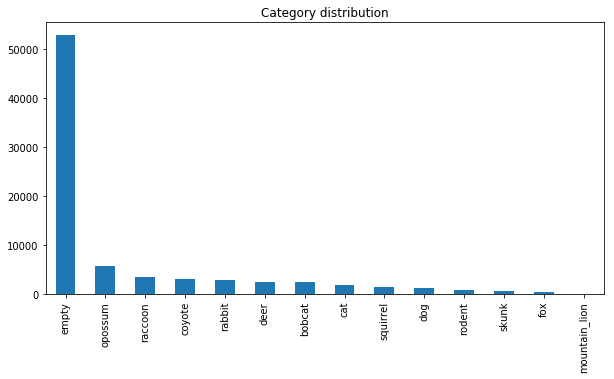

In [54]:
# df = train_df_all
df = train_sample_df
classes_wild = {0: 'empty', 1: 'deer', 2: 'moose', 3: 'squirrel', 4: 'rodent', 5: 'small_mammal', \
                6: 'elk', 7: 'pronghorn_antelope', 8: 'rabbit', 9: 'bighorn_sheep', 10: 'fox', 11: 'coyote', \
                12: 'black_bear', 13: 'raccoon', 14: 'skunk', 15: 'wolf', 16: 'bobcat', 17: 'cat',\
                18: 'dog', 19: 'opossum', 20: 'bison', 21: 'mountain_goat', 22: 'mountain_lion'}
df['classes_wild'] = df['category_id'].apply(lambda cw: classes_wild[cw])
print(df['classes_wild'].value_counts())
plt.figure(figsize=(10,5))
df['classes_wild'].value_counts().plot(kind='bar',  title="Category distribution",);
plt.show()

Visualizing images from each category

In [0]:
def draw_category_images(df, img_filepaths, category, data_dir):
    df_cat = df[df['classes_wild']== category]
    df_cat = df_cat[['classes_wild', 'file_name', 'folder']]
    plt.rcParams['figure.figsize'] = (16, 16)
    plt.subplots_adjust(wspace=0, hspace=0)
    i_ = 0
    
    for l in range(25):
        cat, img_filename, folder = df_cat.sample(1).values[0]
        
        num_str = "{:03d}".format(folder)
        subfolder_path = os.path.join(data_dir, num_str)
        img_path = os.path.join(subfolder_path, img_filename)

        img = cv2.imread(img_path)

        plt.subplot(5, 5, i_+1).set_title(category, fontsize = 9)
        plt.imshow(img); plt.axis('off')
        i_ += 1
    plt.show()

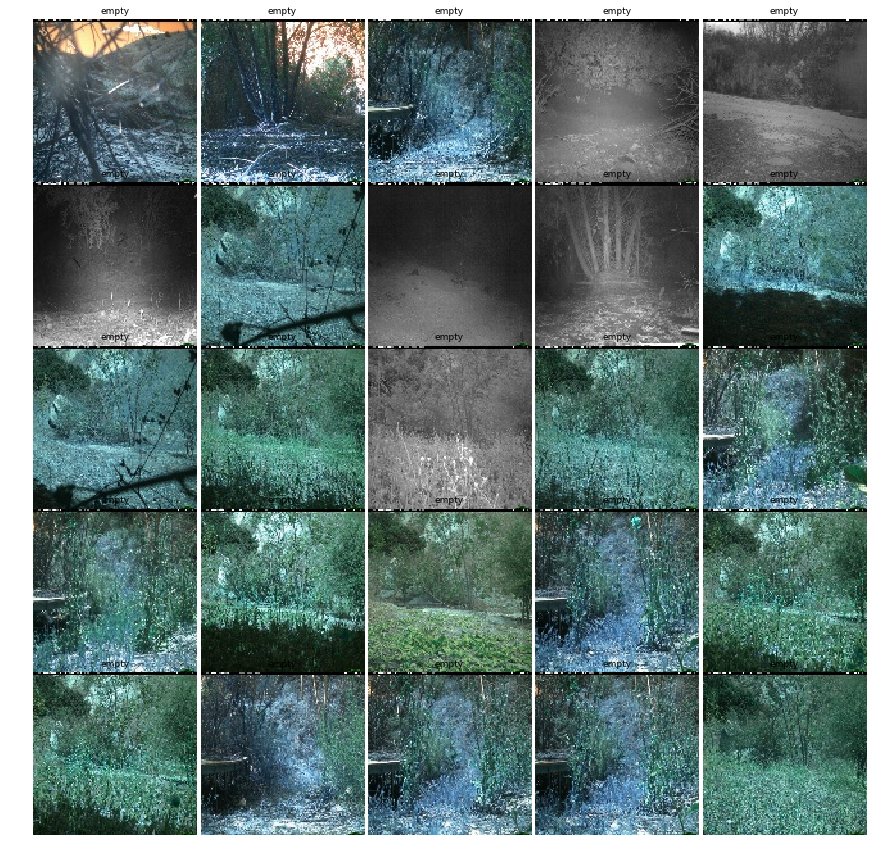

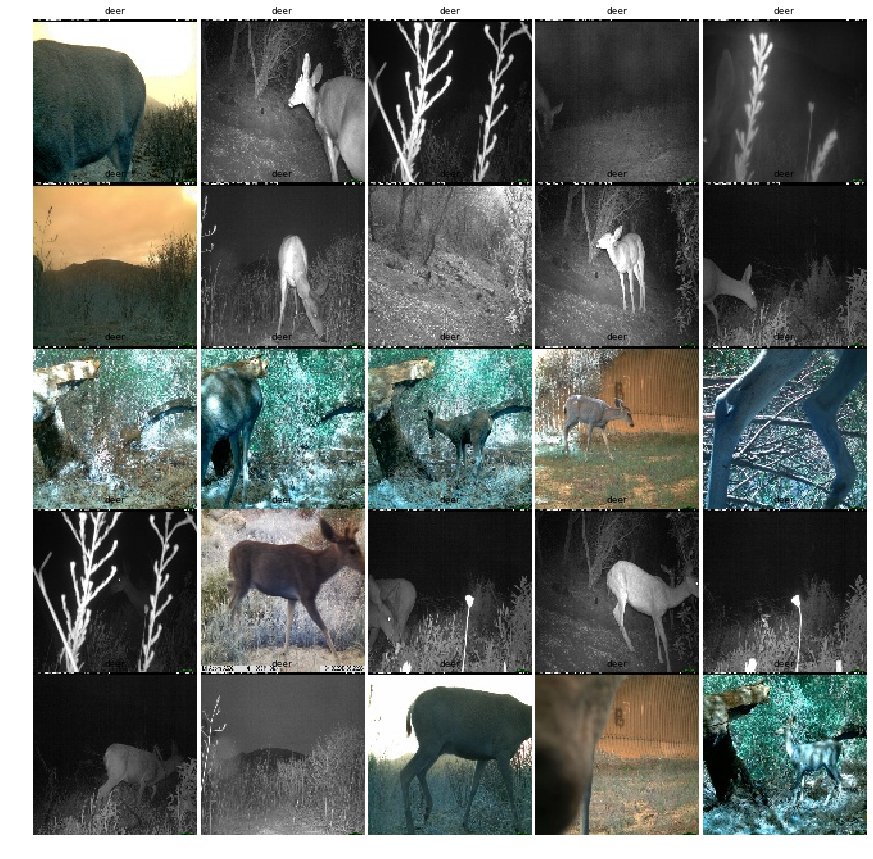

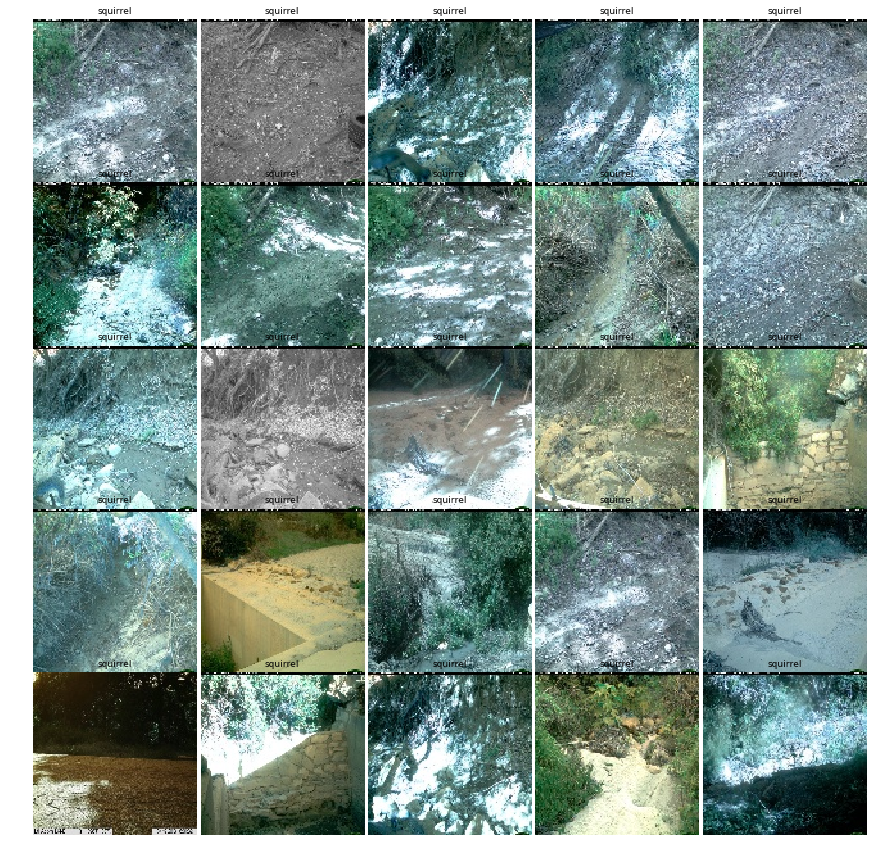

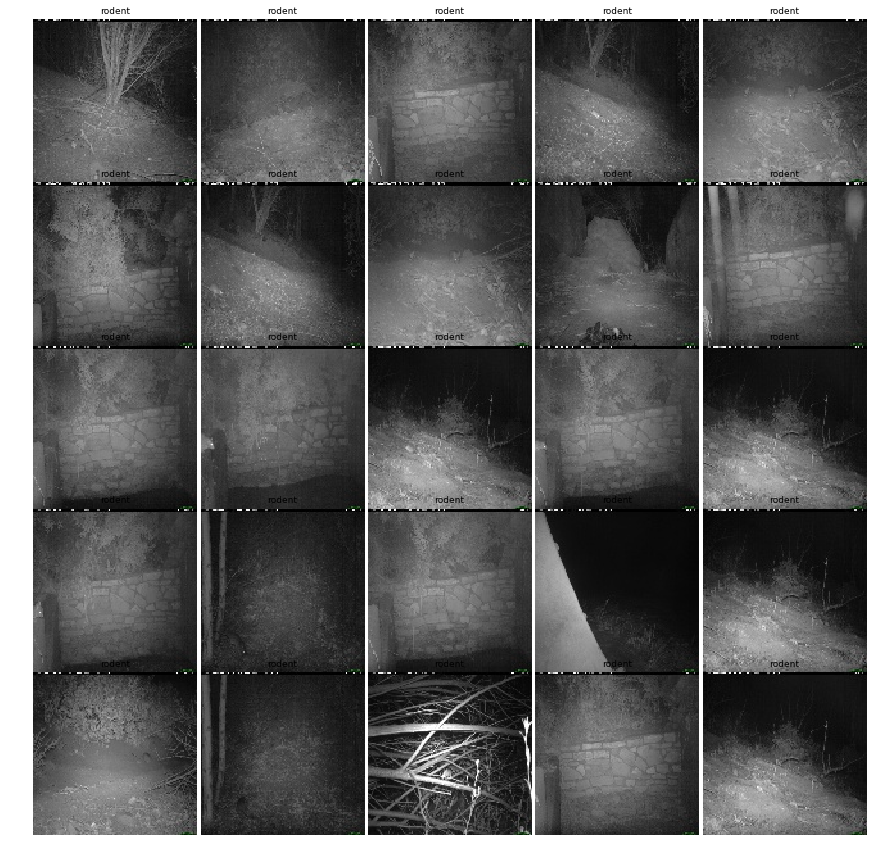

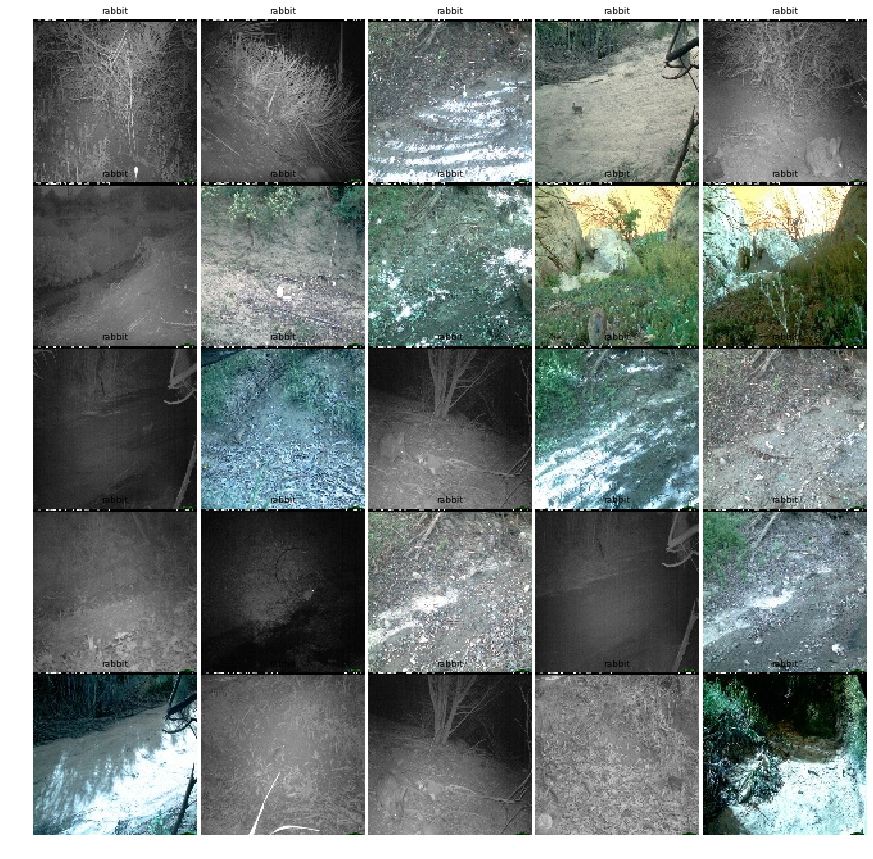

...

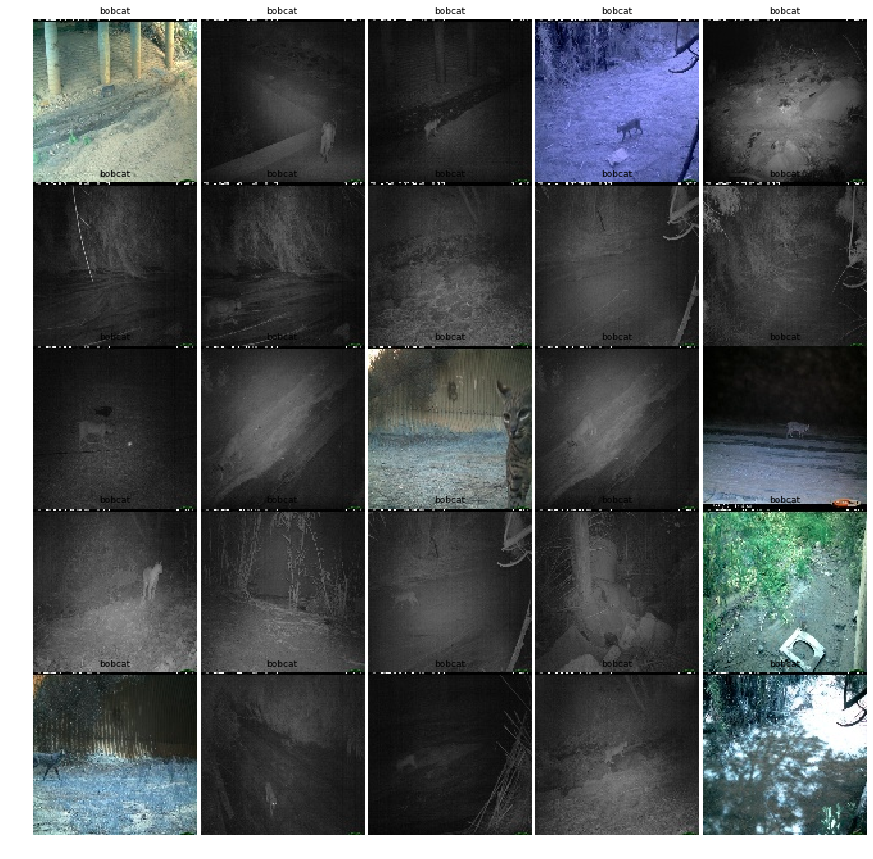

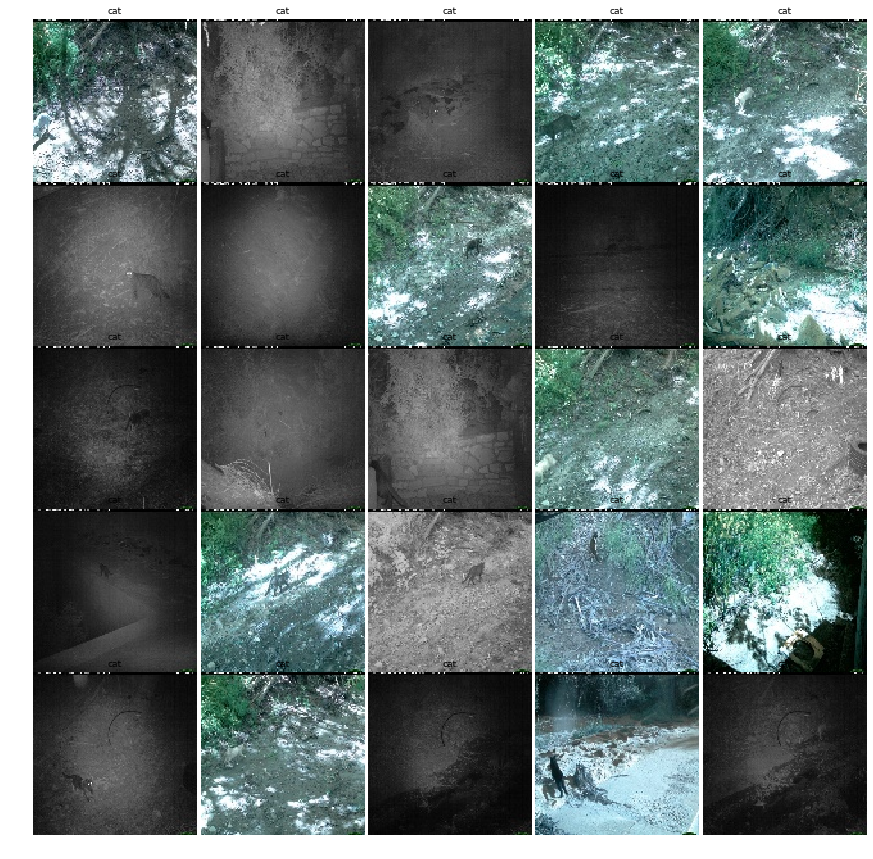

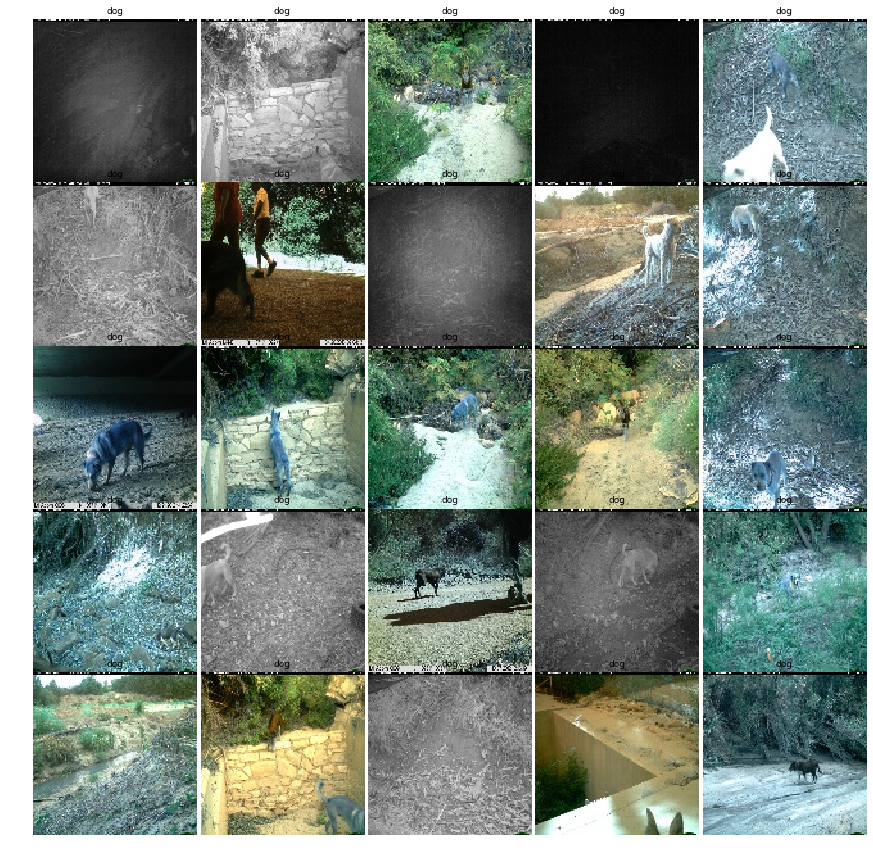

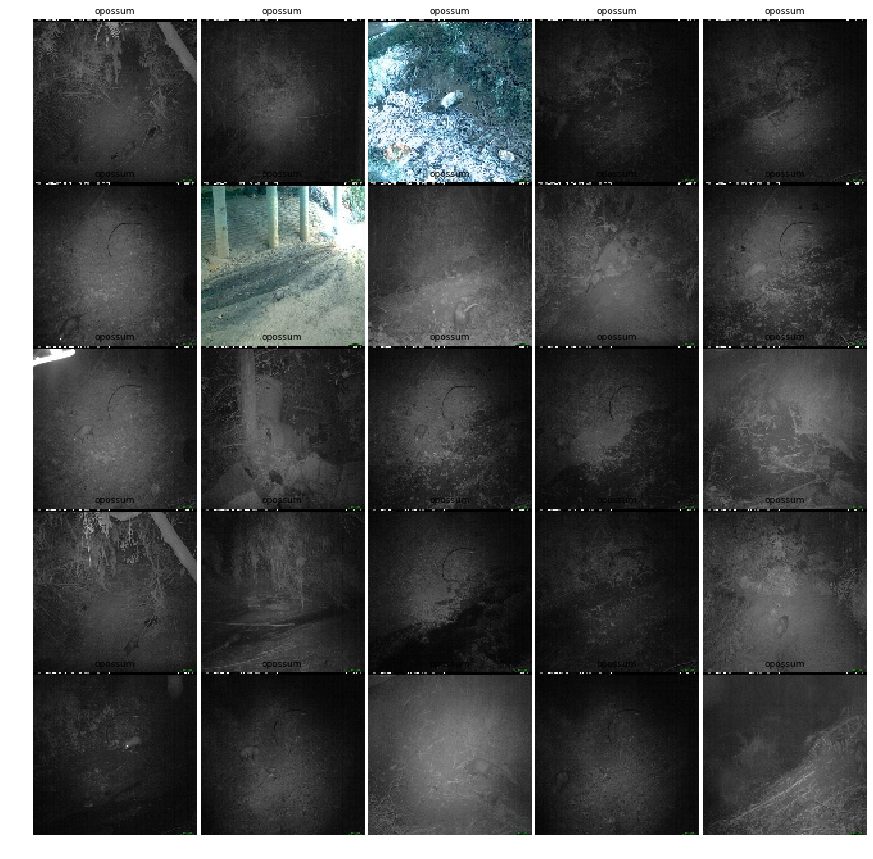

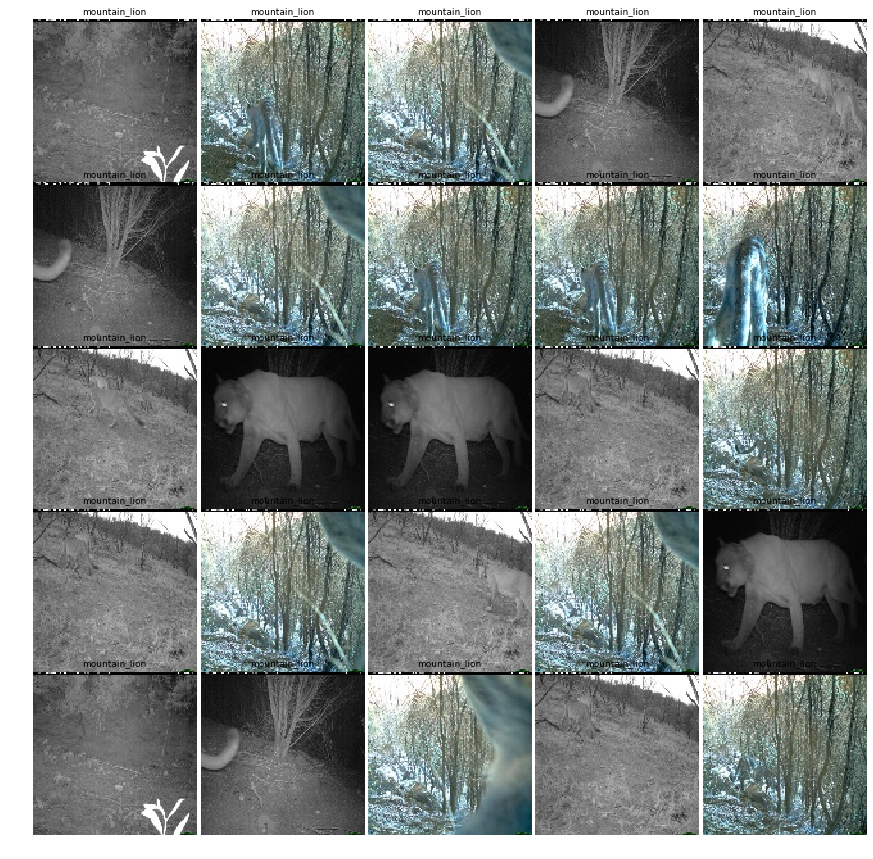

In [135]:
for key, cat in classes_wild.items():
    #print(cat)
    if (any(df['classes_wild']== cat)):
        draw_category_images(df=df, img_filepaths = TRAIN_FILEPATHS, data_dir=TRAIN_IMGS_RESIZED,category=cat)

### Image processing with OpenCV

In [0]:
def applyWhiteBalanceAndCLAHE(og_img, wb, clahe):
    temp_img = og_img  

    img_wb = wb.balanceWhite(temp_img)
    img_lab = cv2.cvtColor(img_wb, cv2.COLOR_BGR2Lab)
    l, a, b = cv2.split(img_lab)
    res_l = clahe.apply(l)
    res = cv2.merge((res_l, a, b))
    res = cv2.cvtColor(res, cv2.COLOR_Lab2BGR)
    return res
    
def draw_category_processed_images(df, category, data_dir, wb, clahe, desired_size = 248):
    df_cat = df[df['classes_wild']== category]
    df_cat = df_cat[['classes_wild', 'file_name', 'folder']]
    plt.rcParams['figure.figsize'] = (16, 16)
    plt.subplots_adjust(wspace=0, hspace=0)
    i_ = 0
    
    for l in range(5):
        cat, img_filename, folder = df_cat.sample(1).values[0]
        img_path = os.path.join(data_dir, img_filename)

        img = cv2.imread(img_path)
        img = cv2.resize(img, (desired_size, desired_size))
        img = applyWhiteBalanceAndCLAHE(img, wb, clahe)

        plt.subplot(1, 5, i_+1).set_title(category, fontsize = 9)
        plt.imshow(img); plt.axis('off')
        i_ += 1
    plt.show()

Running the image processing for the resized images

In [174]:
# num_show = 10
# columns = 5
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(4, 4)) # og was 16x16, but if we apply this to resized images it does not make much sense
#wb = cv2.xphoto.createSimpleWB()
#wb.setP(0.2)
wb = cv2.xphoto.createLearningBasedWB()
wb.setSaturationThreshold(0.99)
for key, cat in classes_wild.items():
    if (any(df['classes_wild']== cat)):
        draw_category_processed_images(df, cat, TRAIN_IMGS_DIR, wb, clahe)
#visualizeImageProcessing(TRAIN_IMGS_DIR, wb, clahe, num_show, columns)

error: ignored

<Figure size 1152x1152 with 0 Axes>

## Constructing the Network
This section constructs the neural network to be used.

### Splitting the training data to training and test sets

In [13]:
df = train_sample_df # Alias for given dataframe
N_df = len(df)
#df = train_folder_df
print("Splitting the training data to training and validation sets.")
train_df, test_df = train_test_split(df[[ID_COLNAME, ANSWER_COLNAME, FOLDER_COLNAME]],
                                     test_size = SPLIT_TRAIN_FRACTION,                                     
                                     shuffle = True
                                    )
print("Train set size: %d/%d"%(len(train_df),N_df))
print("Test set size: %d/%d"%(len(test_df),N_df))
train_df.head(10)

Splitting the training data to training and validation sets.
Train set size: 67150/79000
Test set size: 11850/79000


,file_name,category_id,folder
26175,58995a70-23d2-11e8-a6a3-ec086b02610b.jpg,0,27
1160,58732da5-23d2-11e8-a6a3-ec086b02610b.jpg,0,2
28118,59ef8ce7-23d2-11e8-a6a3-ec086b02610b.jpg,0,29
57716,58ef6e3e-23d2-11e8-a6a3-ec086b02610b.jpg,0,58
5065,590b9caf-23d2-11e8-a6a3-ec086b02610b.jpg,0,6
654,591998db-23d2-11e8-a6a3-ec086b02610b.jpg,0,1
3614,591e4092-23d2-11e8-a6a3-ec086b02610b.jpg,0,4
2642,58d47de9-23d2-11e8-a6a3-ec086b02610b.jpg,0,3
15973,59d5b561-23d2-11e8-a6a3-ec086b02610b.jpg,0,16
12123,59bac843-23d2-11e8-a6a3-ec086b02610b.jpg,19,13


In [14]:
## This block identifies each unique class in the dataset as not all the labels were present in the dataset
CLASSES_TO_USE = df['category_id'].unique()
NUM_CLASSES = len(CLASSES_TO_USE)
CLASSMAP = dict(
    [(i, j) for i, j
     in zip(CLASSES_TO_USE, range(NUM_CLASSES))
    ]
)
REVERSE_CLASSMAP = dict([(v, k) for k, v in CLASSMAP.items()]) # required later for submission
print(CLASSMAP.keys())
print("Number of unique classes in the training data: ", NUM_CLASSES)

dict_keys([0, 11, 16, 1, 17, 19, 13, 8, 18, 3, 14, 4, 10, 22])
Number of unique classes in the training data:  14


Starting out with loading pre-trained network's weights. Here interested in DenseNet-121 trained with ImageNet dataset.

In [16]:
print("Loading the transfer learned model.")
model = models.densenet121(pretrained='imagenet')
print("Forming the new classifier layer to match the dimensions of this task")
new_head = torch.nn.Linear(model.classifier.in_features, NUM_CLASSES)
model.classifier = new_head
if os.path.exists(MODEL_PATH):
  print("Loading weights of model: ", MODEL_NAME)
  model.load_state_dict(torch.load(MODEL_PATH))
model.cuda();

Forming the new classifier layer to match the dimensions of this task
Loading weights of model:  densenet-121-79k


Some transformation are needed to use the existing network structure and input ranges.

In [0]:
normalizer = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])

train_augmentation = transforms.Compose([
    transforms.Resize((IMG_SIZE,IMG_SIZE)),
    transforms.ToTensor(),
    normalizer,
])

val_augmentation = transforms.Compose([
    transforms.Resize((IMG_SIZE,IMG_SIZE)),
    transforms.ToTensor(),
    normalizer,
])
print("Transformations have been set.")

In [0]:
class IMetDataset(Dataset):
    
    def __init__(self,
                 df,
                 image_dir,
                 n_classes = NUM_CLASSES,
                 id_colname = ID_COLNAME,
                 answer_colname = ANSWER_COLNAME,
                 label_dict = CLASSMAP,                
                 foldersize = FOLDERSIZE,
                 transforms = None,
                 clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(4, 4)),
                 wb = cv2.xphoto.createLearningBasedWB().setSaturationThreshold(0.99)
                ):
        self.df = df
        self.main_folder = image_dir
        self.n_classes = n_classes
        self.id_colname = id_colname
        self.answer_colname = answer_colname
        self.label_dict = label_dict
        self.transforms = transforms
        self.foldersize = foldersize
        self.clahe = clahe
        self.wb = wb
    
    def __len__(self):
        return self.df.shape[0]
    
    def __getitem__(self, idx):
        # This idx needs to guide the row of df to take
        df_row = self.df.iloc[idx]
        #print("Current row: \n", df_row)
        if (df_row.empty):
            raise IndexError("The given index was outside the range of dataframe rows.")
        img_id = df_row[self.id_colname]
        #print("Image ID: ", df_row.name)
        
        # Now, because we had to split our data into subfolders, some gimmicks were necessary
        img_filename = df_row.loc[self.id_colname]
        
        if (self.foldersize > 1000):
            #print("Main folder is ", self.main_folder)
            print("Image filename is ", img_filename)
            img_path = os.path.join(self.main_folder, img_filename)
        else:
            num_str = "{:03d}".format(df_row.iloc[2])
            subfolder_path = os.path.join(self.main_folder, num_str)
            img_path = os.path.join(subfolder_path, img_filename)
        
        # Choose one approach
        # Approach 1: use openCV to process images as they are loaded
        #img = self.apply_image_processing(img_path)
        
        # Approach 2: use images directly from memory
        img = Image.open(img_path)
        
        
        if self.transforms is not None:
            img = self.transforms(img)
        
        if self.answer_colname is not None:              
            label = torch.zeros((self.n_classes,), dtype=torch.float32)
            lb = df_row.iloc[1]
            #print("Label: ", lb)
            label[self.label_dict[lb]] = 1.0
            #print("Label updated:", label)
            return img, label
        
        else:
            return img, img_id
    
    def apply_image_processing(self, img_path):
        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
        img_wb = self.wb.balanceWhite(temp_img)
        img_lab = cv2.cvtColor(img_wb, cv2.COLOR_BGR2Lab)
        l, a, b = cv2.split(img_lab)
        res_l = self.clahe.apply(l)
        res = cv2.merge((res_l, a, b))

        img = cv2.cvtColor(res, cv2.COLOR_Lab2BGR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = Image.fromarray(img)
        return img


In [20]:
print("Forming the training dataset.")
train_dataset = IMetDataset(train_df, 
                            TRAIN_IMGS_RESIZED, 
                            transforms = train_augmentation)
test_dataset = IMetDataset(test_df, 
                           TRAIN_IMGS_RESIZED, 
                           transforms = val_augmentation)
train_loader = DataLoader(train_dataset, 
                          batch_size=TRAIN_BS, 
                          shuffle=True, 
                          num_workers=WORKERS, 
                          pin_memory=True)
test_loader = DataLoader(test_dataset, 
                         batch_size=TRAIN_BS, 
                         shuffle=False, 
                         num_workers=WORKERS, 
                         pin_memory=True)

Forming the training dataset.


## Training the Network

With the training and validation datasets loaded and ready, given model can be trained on them. 

In [0]:
## Functions for network learning, evaluation, and helper functions
def cuda(x):
    return x.cuda(non_blocking=True)

def f1_score(y_true, y_pred, threshold=0.5):
    return fbeta_score(y_true, y_pred, 1, threshold)


def fbeta_score(y_true, y_pred, beta, threshold, eps=1e-9):
    beta2 = beta**2

    y_pred = torch.ge(y_pred.float(), threshold).float()
    y_true = y_true.float()

    true_positive = (y_pred * y_true).sum(dim=1)
    precision = true_positive.div(y_pred.sum(dim=1).add(eps))
    recall = true_positive.div(y_true.sum(dim=1).add(eps))

    return torch.mean(
        (precision*recall).
        div(precision.mul(beta2) + recall + eps).
        mul(1 + beta2))

def kaggle_commit_logger(str_to_log, need_print = True):
    if need_print:
        print(str_to_log)
    os.system('echo ' + str_to_log)

def train_one_epoch(model, train_loader, criterion, optimizer, steps_upd_logging = 250):
    model.train();
    
    total_loss = 0.0
    
    train_tqdm = tqdm_notebook(train_loader)
    
    for step, (features, targets) in enumerate(train_tqdm):
        features, targets = cuda(features), cuda(targets)
        
        optimizer.zero_grad()
        
        logits = model(features)
        
        loss = criterion(logits, targets)
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
        
        if (step + 1) % steps_upd_logging == 0:
            logstr = f'Train loss on step {step + 1} was {round(total_loss / (step + 1), 5)}'
            train_tqdm.set_description(logstr)
            kaggle_commit_logger(logstr, need_print=False)
        
    return total_loss / (step + 1)
  
def validate(model, valid_loader, criterion, need_tqdm = False):
    model.eval();
    
    test_loss = 0.0
    TH_TO_ACC = 0.5
    
    true_ans_list = []
    preds_cat = []
    
    with torch.no_grad():
        
        if need_tqdm:
            valid_iterator = tqdm_notebook(valid_loader)
        else:
            valid_iterator = valid_loader
        
        for step, (features, targets) in enumerate(valid_iterator):
            features, targets = cuda(features), cuda(targets)

            logits = model(features)
            loss = criterion(logits, targets)

            test_loss += loss.item()
            true_ans_list.append(targets)
            preds_cat.append(torch.sigmoid(logits))

        all_true_ans = torch.cat(true_ans_list)
        all_preds = torch.cat(preds_cat)
                
        f1_eval = f1_score(all_true_ans, all_preds).item()

    logstr = f'Mean val f1: {round(f1_eval, 5)}'
    kaggle_commit_logger(logstr)
    return test_loss / (step + 1), f1_eval

In [0]:
## Choosing the model's loss function, optimizer and scheduler
criterion = torch.nn.BCEWithLogitsLoss()
#criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.0005)
sheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.5, patience=3)

In [0]:
# To reset training results in this session
TRAIN_LOGGING_EACH = 500

train_losses = []
valid_losses = []
valid_f1s = []
best_model_f1 = 0.0
best_model = None
best_model_ep = 0

In [182]:
%%time

for epoch in range(1, N_EPOCHS + 1):
    ep_logstr = f"Starting {epoch} epoch..."
    kaggle_commit_logger(ep_logstr)
    tr_loss = train_one_epoch(model, train_loader, criterion, optimizer, TRAIN_LOGGING_EACH)
    train_losses.append(tr_loss)
    tr_loss_logstr = f'Mean train loss: {round(tr_loss,5)}'
    kaggle_commit_logger(tr_loss_logstr)
    
    print("Validating this epoch.")
    valid_loss, valid_f1 = validate(model, test_loader, criterion, need_tqdm = True)  
    valid_losses.append(valid_loss)    
    valid_f1s.append(valid_f1)       
    val_loss_logstr = f'Mean valid loss: {round(valid_loss,5)}'
    kaggle_commit_logger(val_loss_logstr)
    sheduler.step(valid_loss)
    
    if valid_f1 >= best_model_f1:    
        best_model = model        
        best_model_f1 = valid_f1        
        best_model_ep = epoch

Starting 1 epoch...


Mean train loss: 0.04357
Validating this epoch.


Mean val f1: 0.84782
Mean valid loss: 0.04108
Starting 2 epoch...


Mean train loss: 0.03625
Validating this epoch.


Mean val f1: 0.87069
Mean valid loss: 0.0378
Starting 3 epoch...


Mean train loss: 0.03099
Validating this epoch.


Mean val f1: 0.88177
Mean valid loss: 0.0356
Starting 4 epoch...


Mean train loss: 0.02766
Validating this epoch.


Mean val f1: 0.8944
Mean valid loss: 0.03303
Starting 5 epoch...


Mean train loss: 0.02452
Validating this epoch.


Mean val f1: 0.89266
Mean valid loss: 0.03259
Starting 6 epoch...


Mean train loss: 0.02183
Validating this epoch.


Mean val f1: 0.89828
Mean valid loss: 0.03102
Starting 7 epoch...


Mean train loss: 0.01988
Validating this epoch.


Mean val f1: 0.90315
Mean valid loss: 0.0345
Starting 8 epoch...


Mean train loss: 0.01808
Validating this epoch.


Mean val f1: 0.9074
Mean valid loss: 0.03234
Starting 9 epoch...


Mean train loss: 0.01632
Validating this epoch.


Mean val f1: 0.90731
Mean valid loss: 0.03333
Starting 10 epoch...


Mean train loss: 0.01516
Validating this epoch.


Mean val f1: 0.91091
Mean valid loss: 0.03373
CPU times: user 56min 46s, sys: 1min 52s, total: 58min 39s
Wall time: 2h 22min 23s


In [183]:
if not os.path.isdir(MODEL_DIR):
    os.makedirs(MODEL_DIR)
if best_model != None:
    torch.save(best_model.state_dict(), MODEL_PATH)
    print('Saved trained model at %s ' % MODEL_PATH)

Saved trained model at /content/gdrive/My Drive/Colab Notebooks/deeplearn2019/project/data/models/densenet-121-79k 


## Result evaluation and visualization

### Visualizing training results

In [29]:
print("Selecting the best model ")
if (best_model != None) & (best_model_f1 > 0):
    bestmodel_logstr = f'Best f1 is {round(best_model_f1, 5)} on epoch {best_model_ep}'
    kaggle_commit_logger(bestmodel_logstr)
else:
    print("Using pretrained model.")
    best_model = model

Selecting the best model 
Using pretrained model.


Plotting the training loss and f1 validation scores over epochs.


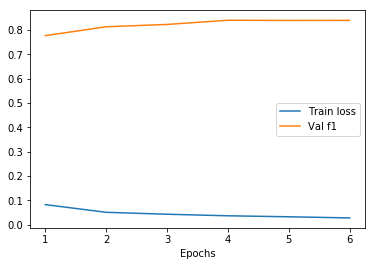

In [26]:
if (len(train_losses) > 0):
    print("Plotting the training loss and f1 validation scores over epochs.")
    xs = list(range(1, len(train_losses) + 1))

    plt.plot(xs, train_losses, label = 'Train loss');
    # plt.plot(xs, valid_losses, label = 'Val loss');
    plt.plot(xs, valid_f1s, label = 'Val f1');
    plt.legend();
    plt.xticks(xs);
    plt.xlabel('Epochs');

### Evaluating the trained model

With the model trained, the model is used to predict the labels of the test dataset

In [21]:
print("Reading the sample_submission.csv to receive the test filenames to be classified.")
SAMPLE_SUBMISSION_DF = pd.read_csv(SAMPLE_SUBMISSION)
print("Converting the sample submission dataframe to match training dataset headers and values.")
SAMPLE_SUBMISSION_DF.rename(columns={'Id':ID_COLNAME,'Predicted':ANSWER_COLNAME}, inplace=True)
SAMPLE_SUBMISSION_DF[ID_COLNAME] = SAMPLE_SUBMISSION_DF[ID_COLNAME] + '.jpg'
SAMPLE_SUBMISSION_DF.head()

Reading the sample_submission.csv to receive the test filenames to be classified.
Converting the sample submission dataframe to match training dataset headers and values.


,file_name,category_id
0,b005e5b2-2c0b-11e9-bcad-06f10d5896c4.jpg,0
1,f2347cfe-2c11-11e9-bcad-06f10d5896c4.jpg,0
2,27cf8d26-2c0e-11e9-bcad-06f10d5896c4.jpg,0
3,f82f52c7-2c1d-11e9-bcad-06f10d5896c4.jpg,0
4,e133f50d-2c1c-11e9-bcad-06f10d5896c4.jpg,0


In [47]:
#print("Gathering filepaths of test images across all subfolders.")
#TEST_FILEPATHS = get_filepaths_of_subfolders(TEST_IMGS_RESIZED, TEST_SUBFOLDERS)
#TEST_FILEPATHS = get_filepaths(TEST_IMGS_RESIZED)

if os.path.isfile(TEST_SAMPLE_CSV_DIR):
    print("Loading the sample dataframe from a file.")
    submission_sample_df = pd.read_csv(TEST_SAMPLE_CSV_DIR)
else:
    print("Filepaths for test images have been stored.")
    test_img_filenames = extract_img_filenames(TEST_FILEPATHS)
    print("Image filenames have been extracted.")
    submission_sample_df = form_df_from_filenames(SAMPLE_SUBMISSION_DF, test_img_filenames)
    print("New dataframe was formed to match the sample set of test data.")
    submission_sample_df = add_folder_numbers(submission_sample_df, TEST_SUBFOLDERS, 2, SUB_FOLDERSIZE)
    print("The folder locations of each image has been appended to the datafram for fast look-up.")
    submission_sample_df.to_csv(TEST_SAMPLE_CSV_DIR)

print("Test files to evaluate",len(submission_sample_df))
print(submission_sample_df.iloc[0])

Loading the sample dataframe from a file.
Test files to evaluate 56103
Unnamed: 0                                       153307
file_name      631769af-2c05-11e9-bcad-06f10d5896c4.jpg
category_id                                           0
folder                                                1
Name: 0, dtype: object


In [61]:

subm_dataset = IMetDataset(submission_sample_df,
                           image_dir = TEST_IMGS_RESIZED,
                           transforms = val_augmentation,
                           foldersize = SUB_FOLDERSIZE,
                           answer_colname=None
                          )
subm_dataloader = DataLoader(subm_dataset,
                             batch_size=SUMB_BS,
                             shuffle=False,
                             pin_memory=True)
print("The test dataset is ready.")

The test dataset is ready.


In [0]:
# Predicts labels for the submission dataset using the given model
def get_subm_answers(model, subm_dataloader, need_tqdm = False):
    model.eval();
    preds_cat = []
    ids = []
    
    with torch.no_grad():
        
        if need_tqdm:
            subm_iterator = tqdm_notebook(subm_dataloader)
        else:
            subm_iterator = subm_dataloader

        for step, (features, subm_ids) in enumerate(subm_iterator):
            features = cuda(features)
            #print("Submission iterator: ", subm_iterator)
            logits = model(features)
            preds_cat.append(torch.sigmoid(logits))
            #print("Submission IDs: ",subm_ids)
            ids += subm_ids

        all_preds = torch.cat(preds_cat)
        all_preds = torch.argmax(all_preds, dim=1).int().cpu().numpy()
    return all_preds, ids


In [0]:
# Just in case no model has yet been saved
if (best_model == None):
  best_model = model

In [64]:
%%time
print("Starting the label prediction with the given test dataset.")

best_model.cuda();

subm_preds, submids = get_subm_answers(best_model, subm_dataloader, True)

print("Total predictions made: ", len(subm_preds))
ans_dict = dict(zip(submids, subm_preds.astype(str)))

Starting the label prediction with the given test dataset.


Image filename is  631769af-2c05-11e9-bcad-06f10d5896c4.jpg


OSError: ignored

In [0]:
print("Total predictions made: ", len(subm_preds))
ans_dict = dict(zip(submids, subm_preds.astype(str)))

### Preparing the submission

In [0]:
# Forming a dataframe based on the evaluation results
df_to_process = (
    pd.DataFrame
    .from_dict(ans_dict, orient='index', columns=['Predicted'])
    .reset_index()
    .rename({'index':'Id'}, axis=1)    
)
df_to_process['Id'] = df_to_process['Id'].map(lambda x: str(x)[:-4])
df_to_process.head()

In [0]:
# Essentially reverses the prediction label back to the full set of class choices 
def process_one_id(id_classes_str):
    if id_classes_str:
        return REVERSE_CLASSMAP[int(id_classes_str)]
    else:
        return id_classes_str

In [0]:
#df_to_process['Predicted'] = df_to_process['Predicted'].apply(process_one_id)
print("Test images to evaluate: ", len(df_to_process))
#print(df_to_process.head())
print(df_to_process['Predicted'].value_counts())

plt.figure(figsize=(10,5))
df_to_process['Predicted'].value_counts().plot(kind='bar',  title="Category distribution",);
plt.show()

In [0]:
## Because we don't use the whole test data set, the predicted labels will be 
## assigned to submission dataframe by searching for the right row
# This will take a lot of time to run because of the searching
SAMPLE_SUBMISSION_DF = pd.read_csv(SAMPLE_SUBMISSION)
for count, file in enumerate(df_to_process['Id']):
    label = df_to_process['Predicted'][count]
    #print('Label to place:', label)
    conditions = (SAMPLE_SUBMISSION_DF['Id'] == file)
    row_idx = SAMPLE_SUBMISSION_DF[conditions].index[0]
    SAMPLE_SUBMISSION_DF.iat[row_idx, 1] = label
    #print("Submission after placement:\n", SAMPLE_SUBMISSION_DF.iloc[row_idx, :])
print("Total: ",len(SAMPLE_SUBMISSION_DF))
#print(SAMPLE_SUBMISSION_DF.head())
print(SAMPLE_SUBMISSION_DF['Predicted'].value_counts())

In [0]:
print(SAMPLE_SUBMISSION_DF['Predicted'].value_counts())
plt.figure(figsize=(10,5))
SAMPLE_SUBMISSION_DF['Predicted'].value_counts().plot(kind='bar',  title="Category distribution",);
plt.show()

In [0]:
# This will save the predicted labels to the submission CSV file
if os.path.exists(SUBMISSION_PATH):
    os.remove(SUBMISSION_PATH)
SAMPLE_SUBMISSION_DF.to_csv(SUBMISSION_PATH, index=False)
print("Submission file is ready.")